#  **Import libraries**

In [1]:
import tensorflow as tf
import IPython.display as display
import PIL
import PIL.Image
import numpy as np
import matplotlib.pyplot as plt
import os
import pathlib
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model

# **Load image data**

In [2]:
dir1 = '../input/Mango/train'
dir2 = '../input/Mango/test'

data_dir = pathlib.Path(dir1)
test_dir = pathlib.Path(dir2)

print(data_dir)
print(test_dir)

../input/Mango/train
../input/Mango/test


# **Number of Images**

In [3]:
train_count = len(list(data_dir.glob('*/*.JPG')))
test_count = len(list(test_dir.glob('*/*.JPG')))
print(train_count)
print(test_count)

412
23


# **show test image**

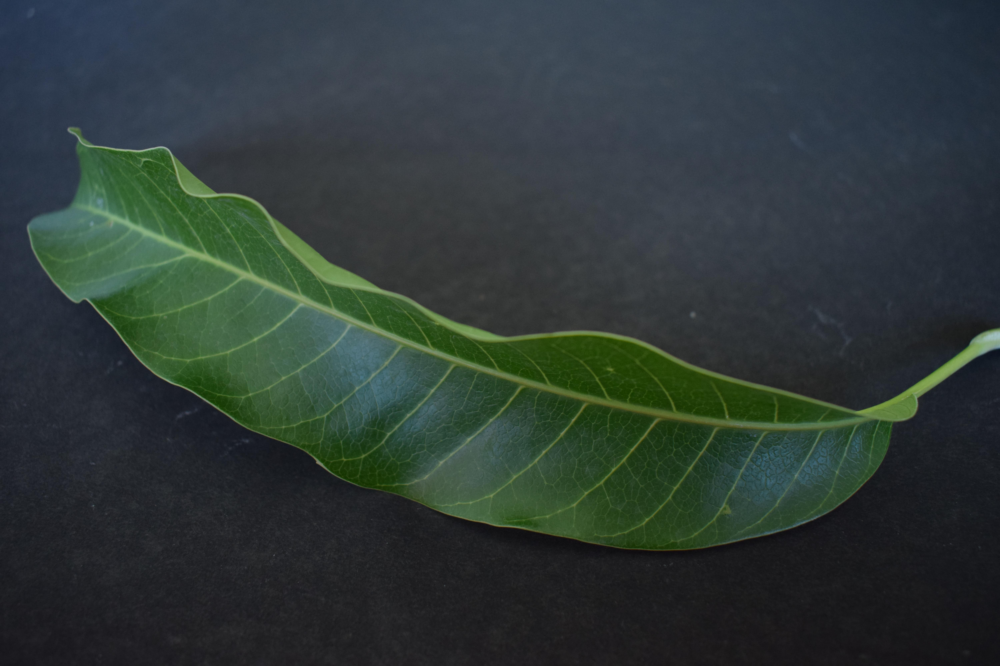

In [4]:
healthy_train = list(data_dir.glob('healthy/*'))
PIL.Image.open(str(healthy_train[0]))

### Image Generator

In [5]:
batch_size = 32
img_height = 180
img_width = 180

In [6]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_gen_train = ImageDataGenerator(rescale = 1./255,
                                     validation_split=0.2,
                                     rotation_range = 45,
                                     width_shift_range=.15,
                                     height_shift_range =.15,
                                     horizontal_flip=True,
                                     zoom_range=0.5)

In [7]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                              subset = 'training',  
                                              directory= data_dir,       
                                              shuffle=True,
                                              target_size=(img_height, img_width)
                                              )    

Found 330 images belonging to 2 classes.


In [8]:
#image_gen_val = ImageDataGenerator(rescale = 1./255)

In [9]:
validation_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                              subset = 'validation',  
                                              directory= data_dir,       
                                              shuffle=True,
                                              target_size=(img_height, img_width)
                                              )  

Found 82 images belonging to 2 classes.


# **Class labels**

In [10]:
CLASS_NAMES = np.array([item.name for item in data_dir.glob('*') if item.name != "LICENSE.txt"])
CLASS_NAMES

array(['healthy', 'diseased'], dtype='<U8')

In [11]:
def show_batch(image_batch, label_batch):
    plt.figure(figsize=(10,10))
    for n in range(25):
        ax = plt.subplot(5,5,n+1)
        plt.imshow(image_batch[n])
        plt.title(CLASS_NAMES[label_batch[n]==1][0].title())
        plt.axis('off')

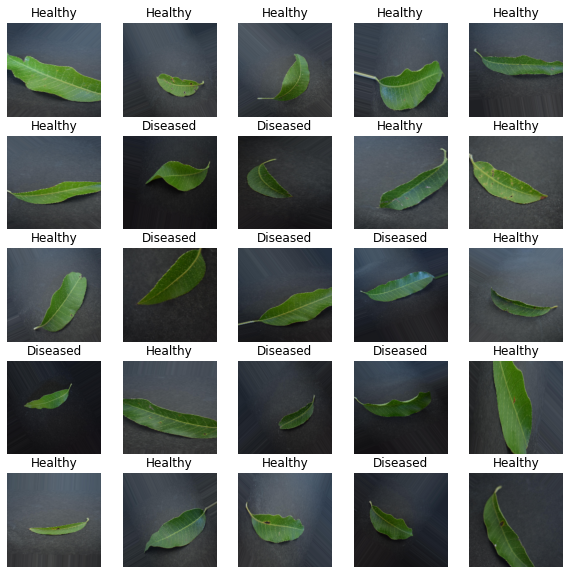

In [12]:
image_batch, label_batch = next(train_data_gen)
show_batch(image_batch, label_batch)

In [13]:
for image_batch, labels_batch in train_data_gen:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32, 2)


### Convolution Neural Network

In [14]:
from tensorflow.keras import layers
num_classes = 2
model_mango = Sequential([
  Conv2D(16, 3, padding='same', activation='relu',
        input_shape=(img_height, img_width ,3)),
  MaxPooling2D(),
  Conv2D(32, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Conv2D(64, 3, padding='same', activation='relu'),
  MaxPooling2D(),
  Dropout(0.2),
  Flatten(),
  Dense(128, activation='relu'),
  Dense(num_classes)
])

In [15]:
model_mango.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [16]:
model_mango.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 180, 180, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 90, 90, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 45, 45, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 22, 22, 64)        0

### Larning rate reducing by 0.1  every 10 epochs on plateau
### Early stopping to stop learning after 24 epochs on plateau (with restoring best model)
### Model checkpoint to save best model to file

In [17]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
rlr = ReduceLROnPlateau(patience=10, verbose=1)
es = EarlyStopping(patience=24, restore_best_weights=True, verbose=1)
mc = ModelCheckpoint('model_mango.hdf5', save_best_only=True, verbose=1)

### Trainingthe created model

In [18]:
epochs = 15
history = model_mango.fit(
  train_data_gen,
  callbacks=[rlr, es, mc],  
  validation_data=validation_data_gen,
  epochs=epochs
)

Train for 11 steps, validate for 3 steps
Epoch 1/15
10/11 [==========================>...] - ETA: 11s - loss: 0.7126 - accuracy: 0.5234
Epoch 00001: val_loss improved from inf to 0.63408, saving model to model_mango.hdf5
11/11 [==============================] - 144s 13s/step - loss: 0.7084 - accuracy: 0.5242 - val_loss: 0.6341 - val_accuracy: 0.5000
Epoch 2/15
10/11 [==========================>...] - ETA: 9s - loss: 0.6238 - accuracy: 0.6091 
Epoch 00002: val_loss improved from 0.63408 to 0.56913, saving model to model_mango.hdf5
11/11 [==============================] - 137s 12s/step - loss: 0.6191 - accuracy: 0.6227 - val_loss: 0.5691 - val_accuracy: 0.7744
Epoch 3/15
10/11 [==========================>...] - ETA: 10s - loss: 0.5659 - accuracy: 0.7672
Epoch 00003: val_loss improved from 0.56913 to 0.50974, saving model to model_mango.hdf5
11/11 [==============================] - 134s 12s/step - loss: 0.5648 - accuracy: 0.7667 - val_loss: 0.5097 - val_accuracy: 0.7744
Epoch 4/15
10/11 [

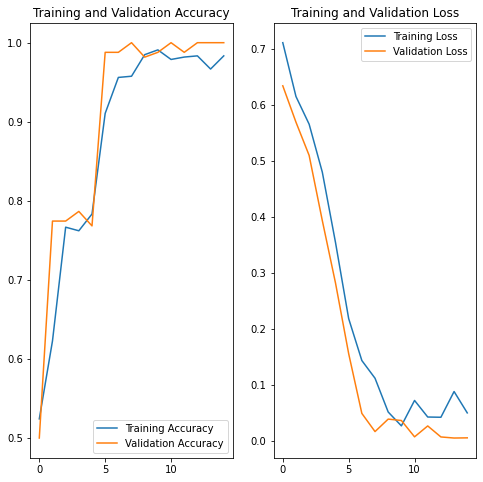

In [19]:
model_mango = load_model('model_mango.hdf5')
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Plot loss and accuracy

In [20]:
image_gen_test = ImageDataGenerator(rescale = 1./255)
test_data_gen = image_gen_test.flow_from_directory(batch_size=32,
                                              directory= test_dir,
                                              shuffle=True,
                                              target_size=(img_height, img_width)
                                              )  

Found 23 images belonging to 2 classes.


In [21]:
predictions = model_mango.predict(test_data_gen)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(CLASS_NAMES[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to healthy with a 100.00 percent confidence.


In [22]:
predictions.shape

(23, 2)

In [23]:
score2 = tf.nn.softmax(predictions)
score2

<tf.Tensor: shape=(23, 2), dtype=float32, numpy=
array([[9.9999964e-01, 3.3767157e-07],
       [1.0000000e+00, 1.8451163e-09],
       [9.9999964e-01, 4.1004253e-07],
       [4.2477641e-05, 9.9995756e-01],
       [9.9999559e-01, 4.3518880e-06],
       [2.1168244e-05, 9.9997878e-01],
       [1.0017561e-05, 9.9998999e-01],
       [1.0000000e+00, 5.9889396e-09],
       [5.7911064e-05, 9.9994206e-01],
       [9.9996102e-01, 3.9005881e-05],
       [1.5872525e-05, 9.9998415e-01],
       [2.9797116e-05, 9.9997020e-01],
       [1.0000000e+00, 4.3421938e-08],
       [1.0000000e+00, 2.5546275e-11],
       [3.0258516e-05, 9.9996972e-01],
       [1.0000000e+00, 9.3171781e-10],
       [1.0000000e+00, 8.8788887e-10],
       [9.9990678e-01, 9.3166884e-05],
       [3.8773680e-05, 9.9996126e-01],
       [1.0000000e+00, 1.4735859e-08],
       [9.9984884e-01, 1.5110012e-04],
       [1.4621354e-05, 9.9998534e-01],
       [1.0000000e+00, 9.9287412e-10]], dtype=float32)>